## Preface

In this report, I would like to provide some insights gained from seek.com.au. 

I've done web scraping based on four job titles: Data Scientist, Data Analyst, Data Engineer and BI Analyst. The objective of this analysis is to answer the question: What skills or factors impact the salary and distinguish the job category?


## 1. A glimpse at the data set

I will firstly go through the data sets. Generally, I scraped a total of 1076 jobs from seek.com.au, in which there are some duplicates. The duplicates can be generated from 2 reasons: 

 1) I divided these jobs into 3 salary ranges, namely 0-70k, 70k-120k and over 120k. Some jobs has salary range across two groups maybe caught twice, e.g., 60k-80k

 2) The jobs have salary exactly as 120k and 70k maybe scraped twice and put into 2 groups.

In this notebook I will explain how I will deal with these duplicates.



I included several features of the jobs, e.g., Job Teaser, Classification and Location. This can be used as the predictors.



## 2. General Approach


I convert the four job categories, job classification and locations as dummy variables. So I will consider Question 1 as a classification problem, because a lot of jobs are missing salary part, so I manually group these jobs into three categories.

I convert all the text into a document term matrix(DTM) containing the TF-IDF scores for each word. Then I feed dummy variables and DTM along into random forest and decision trees to get the classification.

In [163]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

In [164]:
jobs = pd.read_csv('./jobs.csv')

In [165]:
jobs.tail()

,Salary Range,Link,Job Title,Job Teaser,Advertiser,Classification,Location,Strong Words,Job Description,Category
1071,120000-999999,https://www.seek.com.au/job/39576650,Lead Business Intelligence Analyst,Make your mark working with the industry leade...,McMillan Shakespeare,Information & Communication Technology,Melbourne,To succeed as a Lead Business Intelligence Ana...,As a result of growth within the business we a...,BI Analyst
1072,120000-999999,https://www.seek.com.au/job/39597045,Data Analyst - Business Intelligence / Data Wa...,Data Analyst - Business Intelligence / Data Wa...,Infinity Pro,Information & Communication Technology,Toowoomba & Darling Downs,Your Benefits: your CV will need to reflect on...,Your Benefits: Immediate Start; Great Rates Po...,BI Analyst
1073,120000-999999,https://www.seek.com.au/job/39579332,BI / Data Warehouse Analyst Programmer,Join this Government organisation leading the ...,Eden Ritchie Recruitment,Information & Communication Technology,Brisbane,Business Intelligence/Data Warehouse Analyst P...,CBD Location Initial 6 month contract $95 - $1...,BI Analyst
1074,120000-999999,https://www.seek.com.au/job/39588897,Business Intelligence DW Analyst Programmer,Great contract for a large government departme...,Finite IT Recruitment Solutions,Information & Communication Technology,Brisbane,The following work will be involved for the po...,Our client is a large government department an...,BI Analyst
1075,120000-999999,https://www.seek.com.au/job/39572211,Oracle Analytics / BI Senior Consultant - Perth,Seeking for a Senior Oracle Analytics / BI Cos...,DXC Technology Australia Pty LTD,Information & Communication Technology,Perth,Role Description Responsibilities: Skills & Ex...,Role Description Are you ready to deliver indu...,BI Analyst


In [166]:
jobs.shape

(1076, 10)

In [167]:
jobs.describe()

,Salary Range,Link,Job Title,Job Teaser,Advertiser,Classification,Location,Strong Words,Job Description,Category
count,1076,1076,1076,1076,1076,1076,1076,939,1075,1076
unique,3,780,449,682,375,22,18,572,703,4
top,70000-120000,https://www.seek.com.au/job/39713902,Data Analyst,AEMO are responsible for operating Australia’s...,2XM Technology Pty Ltd,Information & Communication Technology,Sydney,"Your new company Your new role ""What youll nee...",About the Role: We are currently looking for a...,Data Analyst
freq,519,4,98,25,26,794,527,17,16,399


We can see from the unique value of links, actually we only obtain 703 different JDs, which means some jobs have been posted several times and we can drop them.

In [168]:
jobs = jobs.drop_duplicates(subset=['Job Description'])

In [169]:
jobs = jobs.reset_index(drop=True)

In [171]:
jobs.describe() #nearly 200 rows were removed

,Salary Range,Link,Job Title,Job Teaser,Advertiser,Classification,Location,Strong Words,Job Description,Category
count,704,704,704,704,704,704,704,624,703,704
unique,3,703,442,680,375,22,18,572,703,4
top,70000-120000,https://www.seek.com.au/job/39711488,Data Analyst,AEMO are responsible for operating Australia’s...,Hays Information Technology,Information & Communication Technology,Sydney,"Your new company Your new role ""What youll nee...",About our Centre Support Office Located in the...,Data Analyst
freq,379,2,64,5,17,539,333,13,1,259


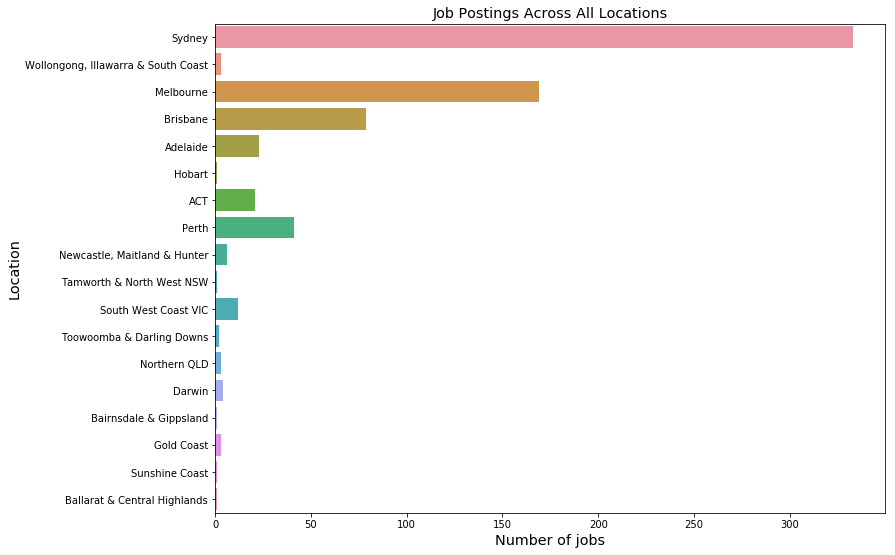

In [172]:
plt.figure(figsize=(12,9))
sns.countplot(y='Location',data=jobs)
plt.xlabel("Number of jobs",{
      'fontsize'            : 'x-large',
      'verticalalignment'   : 'top',
      'horizontalalignment' : 'center'
      })
plt.ylabel('Location',fontsize= 'x-large')
plt.title("Job Postings Across All Locations",fontsize = 'x-large')
plt.show()

In [173]:
import scipy as sp
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from textblob import TextBlob, Word
from nltk.stem.snowball import SnowballStemmer
import re

In [174]:
#dummy variables for Q1&Q2
X1_title = pd.get_dummies(jobs['Category']).astype('float') 
X2_classification = pd.get_dummies(jobs['Classification']).astype('float')  
X3_location = pd.get_dummies(jobs['Location']).astype('float')   

In [175]:
import string
import nltk 
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
import re
from nltk import wordpunct_tokenize
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from textblob import TextBlob, Word
%matplotlib inline

In [176]:
from nltk import wordpunct_tokenize
from nltk import word_tokenize          
from nltk.stem import WordNetLemmatizer 
class LemmaTokenizer(object):
     
    def __init__(self):
        self.wnl = WordNetLemmatizer()
    def __call__(self, articles):
        return [self.wnl.lemmatize(t) for t in word_tokenize(articles)]
    
from nltk.tokenize import RegexpTokenizer

tokenizer = RegexpTokenizer(r'\w+')
 

In [221]:
#Get TDIDF scores.. convert all to lowercase 

vect = TfidfVectorizer(stop_words='english', 
                       lowercase=True, preprocessor= None,
                       analyzer= 'word', token_pattern='(?u)\\b\\w\\w+\\b',
                       ngram_range=(1, 5), max_df=10.0, min_df=1, 
                       max_features=180, 
                       use_idf=True, 
                       smooth_idf=True,
                       tokenizer= tokenizer.tokenize,
                       sublinear_tf=False)

vect.fit(jobs['Job Description'].apply(str))
 
vect.get_feature_names()

#I will use the document term matrix(DTM) below as a predictor attribute for both question one and two.  I decided to set 
#number of features to 180  

dtm = pd.DataFrame(vect.transform(jobs['Job Description'].apply(str)).todense(),
                       columns=vect.get_feature_names()) 


 

In [261]:
dtm.head()

,3,ability,advanced,agile,analysis,analyst,analytical,analytics,application,applications,...,tools,understand,understanding,use,using,value,visualisation,work,working,years
0,0.000000,0.000000,0.0,0.0,0.000000,0.247162,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.077567,0.0,0.000000,0.000000,0.056660,0.000000
1,0.000000,0.000000,0.0,0.0,0.135739,0.079007,0.086594,0.000000,0.000000,0.000000,...,0.000000,0.212422,0.081214,0.181831,0.000000,0.0,0.102415,0.000000,0.054335,0.078248
2,0.141019,0.088533,0.0,0.0,0.000000,0.109966,0.000000,0.000000,0.000000,0.133961,...,0.000000,0.000000,0.000000,0.126542,0.000000,0.0,0.000000,0.070836,0.075627,0.000000
3,0.019188,0.048186,0.0,0.0,0.025708,0.059852,0.000000,0.012964,0.018050,0.018228,...,0.013784,0.020115,0.046143,0.000000,0.014088,0.0,0.000000,0.106025,0.041162,0.000000
4,0.099481,0.000000,0.0,0.0,0.133279,0.000000,0.000000,0.000000,0.187156,0.000000,...,0.000000,0.000000,0.079742,0.000000,0.000000,0.0,0.000000,0.149912,0.000000,0.000000


In [255]:
#Tfidf for Job Teaser

vect_teaser = TfidfVectorizer(stop_words='english', 
                       lowercase=True, preprocessor= None,
                       analyzer= 'word', token_pattern='(?u)\\b\\w\\w+\\b',
                       ngram_range=(1, 5), max_df=10.0, min_df=1, 
                       max_features=180, 
                       use_idf=True, 
                       smooth_idf=True,
                       tokenizer= tokenizer.tokenize,
                       sublinear_tf=False)

vect_teaser.fit(jobs['Job Teaser'].apply(str))
 
vect_teaser.get_feature_names()


dtm_teaser = pd.DataFrame(vect_teaser.transform(jobs['Job Teaser'].apply(str)).todense(),
                       columns=vect_teaser.get_feature_names()) 



In [262]:
dtm_teaser.head()

,12,12 month,2,3,6,6 month,6 month contract,6 months,advanced,analysis,...,technology,term,term contract,time,tools,transformation,use,using,work,working
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.456172,0.0,0.0,0.0,0.0,0.000000,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.336188,0.0


In [257]:
#Tfidf for strong words

vect_strong = TfidfVectorizer(stop_words='english', 
                       lowercase=True, preprocessor= None,
                       analyzer= 'word', token_pattern='(?u)\\b\\w\\w+\\b',
                       ngram_range=(1, 5), max_df=10.0, min_df=1, 
                       max_features=180, 
                       use_idf=True, 
                       smooth_idf=True,
                       tokenizer= tokenizer.tokenize,
                       sublinear_tf=False)

vect_strong.fit(jobs['Strong Words'].apply(str))
 
vect_strong.get_feature_names()

#I will use the document term matrix(DTM) below as a predictor attribute for both question one and two.  I decided to set 
#number of features to 215 . no magic but I wanted to keep a lid on blowing out the attributes by too 
#much and adding unnecessary dimensions to what will already be a large attribute set once I dummy the 
#entire , title, company and location columns. I am also biased towards using word embeddings instead of TFIDF scores 
#and allowed for three hundred features(dimensions) in this model.  

dtm_strong = pd.DataFrame(vect_strong.transform(jobs['Strong Words'].apply(str)).todense(),
                       columns=vect_strong.get_feature_names()) 



In [263]:
dtm_strong.head()

,12,2,2019,4,6,6 month,accountabilities,analyst,analytics,application,...,working,www,xa0,xa0 xa0,xa0 xa0 xa0,xa0 xa0 xa0 xa0,xa0 xa0 xa0 xa0 xa0,youll,youll need,youll need succeed
0,0.0,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.345945,0.184795,0.187166
1,0.0,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000
2,0.0,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000
3,0.0,0.20716,0.181416,0.216148,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000
4,0.0,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.65795,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000


In [258]:
jobs['Job Description'] = jobs['Job Description'].apply(str)

In [197]:
#Word embeddings trained on a skip-gram model with negative sampling. 
#Feature size was set arbitrarly at 300 dimensions.(it could have been larger or smaller if needed).
#I would view each dimension as a possible context in which the vocabulary of the training job summary
#is mapped to each of the 300 contextual dimensions in vector space.
#To clarify the model was trained on all text within the entire job description column.  


import nltk 
from nltk.corpus import stopwords 
from tqdm import tqdm
from gensim.models import Phrases
from gensim.models.phrases import Phraser
from gensim.models import Word2Vec

from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

%matplotlib inline

jobs['Job Description']

tmp_corpus = jobs['Job Description'].apply(lambda x: x.split("."))
len(tmp_corpus)


704

In [200]:
from tqdm import tqdm

In [201]:
tmp_corpus

type(tmp_corpus)

corpus = []

for i in tqdm(range(len(tmp_corpus))):
    for line in tmp_corpus[i]:
        words = [x for x in line.split()]
        corpus.append(words)

100%|█████████████████████████████████████████████████████████████████████████████| 704/704 [00:00<00:00, 14109.35it/s]


In [202]:
num_of_sentences = len(corpus)
num_of_words = 0
for line in corpus:
    num_of_words += len(line)



print('Num of sentences - %s'%(num_of_sentences))
print('Num of words - %s'%(num_of_words))

phrases = Phrases(sentences=corpus,min_count=25,threshold=50)
bigram = Phraser(phrases)

# sg - skip gram |  window = size of the window | size = vector dimension
size = 400 #It could be smaller but I would tend higher with this model than the size of the TFIDF features
window_size = 6 # sentences weren't too long
epochs = 50
min_count = 5
workers = 4

# train word2vec model using gensim
model = Word2Vec(corpus, alpha=0.01,sg=1,window=window_size,size=size,\
                               min_count=min_count,workers=workers,iter=epochs,batch_words=1,negative=25,seed=100)

model.build_vocab(sentences=corpus,update=True)

 
model.train(sentences=corpus,epochs=50,total_examples=model.corpus_count)

model.save('w2v_bftest')

model = Word2Vec.load('w2v_bftest')

w2v = dict(zip(model.wv.index2word, model.wv.syn0))

Num of sentences - 10119
Num of words - 238973


2019-08-25 16:52:26,816 : INFO : collecting all words and their counts
2019-08-25 16:52:26,818 : INFO : PROGRESS: at sentence #0, processed 0 words and 0 word types
2019-08-25 16:52:27,192 : INFO : PROGRESS: at sentence #10000, processed 235714 words and 104778 word types
2019-08-25 16:52:27,198 : INFO : collected 105638 word types from a corpus of 238973 words (unigram + bigrams) and 10119 sentences
2019-08-25 16:52:27,199 : INFO : using 105638 counts as vocab in Phrases<0 vocab, min_count=25, threshold=50, max_vocab_size=40000000>
2019-08-25 16:52:27,203 : INFO : source_vocab length 105638
2019-08-25 16:52:28,028 : INFO : Phraser built with 44 44 phrasegrams
2019-08-25 16:52:28,030 : INFO : collecting all words and their counts
2019-08-25 16:52:28,031 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2019-08-25 16:52:28,077 : INFO : PROGRESS: at sentence #10000, processed 235714 words, keeping 16983 word types
2019-08-25 16:52:28,080 : INFO : collected 17058 

2019-08-25 16:53:25,166 : INFO : EPOCH 19 - PROGRESS: at 72.28% examples, 59743 words/s, in_qsize 7, out_qsize 0
2019-08-25 16:53:25,988 : INFO : worker thread finished; awaiting finish of 3 more threads
2019-08-25 16:53:25,990 : INFO : worker thread finished; awaiting finish of 2 more threads
2019-08-25 16:53:26,005 : INFO : worker thread finished; awaiting finish of 1 more threads
2019-08-25 16:53:26,008 : INFO : worker thread finished; awaiting finish of 0 more threads
2019-08-25 16:53:26,010 : INFO : EPOCH - 19 : training on 238973 raw words (167689 effective words) took 2.8s, 58926 effective words/s
2019-08-25 16:53:27,016 : INFO : EPOCH 20 - PROGRESS: at 34.41% examples, 56220 words/s, in_qsize 8, out_qsize 0
2019-08-25 16:53:28,015 : INFO : EPOCH 20 - PROGRESS: at 65.79% examples, 54659 words/s, in_qsize 6, out_qsize 1
2019-08-25 16:53:29,010 : INFO : worker thread finished; awaiting finish of 3 more threads
2019-08-25 16:53:29,013 : INFO : worker thread finished; awaiting finis

2019-08-25 16:54:27,650 : INFO : worker thread finished; awaiting finish of 3 more threads
2019-08-25 16:54:27,657 : INFO : worker thread finished; awaiting finish of 2 more threads
2019-08-25 16:54:27,672 : INFO : worker thread finished; awaiting finish of 1 more threads
2019-08-25 16:54:27,675 : INFO : worker thread finished; awaiting finish of 0 more threads
2019-08-25 16:54:27,678 : INFO : EPOCH - 39 : training on 238973 raw words (167612 effective words) took 3.2s, 52761 effective words/s
2019-08-25 16:54:28,683 : INFO : EPOCH 40 - PROGRESS: at 33.80% examples, 55349 words/s, in_qsize 8, out_qsize 1
2019-08-25 16:54:29,684 : INFO : EPOCH 40 - PROGRESS: at 68.50% examples, 56852 words/s, in_qsize 8, out_qsize 0
2019-08-25 16:54:30,596 : INFO : worker thread finished; awaiting finish of 3 more threads
2019-08-25 16:54:30,599 : INFO : worker thread finished; awaiting finish of 2 more threads
2019-08-25 16:54:30,611 : INFO : worker thread finished; awaiting finish of 1 more threads
20

2019-08-25 16:55:25,910 : INFO : worker thread finished; awaiting finish of 0 more threads
2019-08-25 16:55:25,912 : INFO : EPOCH - 9 : training on 238973 raw words (167750 effective words) took 2.9s, 58256 effective words/s
2019-08-25 16:55:26,918 : INFO : EPOCH 10 - PROGRESS: at 36.06% examples, 59425 words/s, in_qsize 8, out_qsize 1
2019-08-25 16:55:27,918 : INFO : EPOCH 10 - PROGRESS: at 69.90% examples, 58144 words/s, in_qsize 8, out_qsize 0
2019-08-25 16:55:28,800 : INFO : worker thread finished; awaiting finish of 3 more threads
2019-08-25 16:55:28,803 : INFO : worker thread finished; awaiting finish of 2 more threads
2019-08-25 16:55:28,821 : INFO : worker thread finished; awaiting finish of 1 more threads
2019-08-25 16:55:28,824 : INFO : worker thread finished; awaiting finish of 0 more threads
2019-08-25 16:55:28,827 : INFO : EPOCH - 10 : training on 238973 raw words (167832 effective words) took 2.9s, 57689 effective words/s
2019-08-25 16:55:29,833 : INFO : EPOCH 11 - PROGRE

2019-08-25 16:56:29,971 : INFO : EPOCH - 31 : training on 238973 raw words (167596 effective words) took 2.8s, 59278 effective words/s
2019-08-25 16:56:30,975 : INFO : EPOCH 32 - PROGRESS: at 36.74% examples, 60659 words/s, in_qsize 5, out_qsize 2
2019-08-25 16:56:31,975 : INFO : EPOCH 32 - PROGRESS: at 73.19% examples, 60747 words/s, in_qsize 7, out_qsize 0
2019-08-25 16:56:32,714 : INFO : worker thread finished; awaiting finish of 3 more threads
2019-08-25 16:56:32,717 : INFO : worker thread finished; awaiting finish of 2 more threads
2019-08-25 16:56:32,728 : INFO : worker thread finished; awaiting finish of 1 more threads
2019-08-25 16:56:32,730 : INFO : worker thread finished; awaiting finish of 0 more threads
2019-08-25 16:56:32,732 : INFO : EPOCH - 32 : training on 238973 raw words (167818 effective words) took 2.8s, 60861 effective words/s
2019-08-25 16:56:33,737 : INFO : EPOCH 33 - PROGRESS: at 36.92% examples, 60785 words/s, in_qsize 8, out_qsize 2
2019-08-25 16:56:34,738 : I

In [203]:
model.wv.most_similar(('python'),topn=15)

2019-08-25 16:57:57,645 : INFO : precomputing L2-norms of word weight vectors


[('bash', 0.8711262941360474),
 ('Java,', 0.7283536195755005),
 ('Scala,', 0.6222462058067322),
 ('streaming,', 0.6195588111877441),
 ('(Java,', 0.6103717088699341),
 ('HBase,', 0.5981701612472534),
 ('EMR', 0.5980576276779175),
 ('PowerPoint', 0.5603945255279541),
 ('ethnic', 0.5570648908615112),
 ('Java', 0.555305540561676),
 ('tools;', 0.5542984008789062),
 ('NiFi,', 0.5489961504936218),
 ('self-contained', 0.5450462698936462),
 ('marital,', 0.5382086038589478),
 ('concessions', 0.5365866422653198)]

In [218]:
jobs['salary_bin'] = jobs['Salary Range'].apply(lambda x: '0' if x == '0-70000' else ('1' if x== '70000-120000' else '2'))

In [264]:
#Below there are several random forest models and logistic regression models followed by a pipleine of classification 

#As I mentioned above the first model contains all the dummies and the DTM and it is showing alot of duplication across 
#features that the forests are using to split the data. 
 
#Answers to question one were derived from models below where the various attributes were isolated.
 



from sklearn.ensemble import RandomForestClassifier


#X contains dummy variables for every title, classification,location of job plus the DTM with 180 features.
#The total predictor is over 700 variables.

X = pd.concat([X1_title, X2_classification, X3_location, dtm] ,axis=1, join_axes=[X1_title.index])  

#The dependent variable is binary. 1 for high salary and 0 for low salary jobs.  
y = jobs['salary_bin'].astype(float)

#test train split. I follow this format for splitting the data set for most
#of the analysis below other than the logistic regression model where I train the model of a five
#fold cross val again with all the same predictors
X_train, X_test, y_train, y_test = train_test_split(X, y,random_state=1)




rf = RandomForestClassifier(n_estimators=300, max_features= 15, n_jobs=-1, oob_score=True)
rf.fit(X_train, y_train)

rf.predict(X_train) 
rf.score(X_test,y_test, sample_weight=None)

print(rf.score(X_test,y_test, sample_weight=None))

importances = rf.feature_importances_


from sklearn.tree import DecisionTreeClassifier



dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
importances = pd.DataFrame(zip(dt.feature_importances_,rf.feature_importances_,),
                           index=X.columns, columns=['dt_importance','rf_importance']).sort_values('rf_importance',ascending=False)               
dt.predict(X_test)
dt.score(X_test, y_test,sample_weight=None)
 
print(dt.score(X_test, y_test,sample_weight=None)) 
importances.head(50)





0.5965909090909091
0.5056818181818182


,dt_importance,rf_importance
experience,0.015770,0.015049
contract,0.030622,0.012918
data,0.014523,0.011544
team,0.015852,0.011362
senior,0.019880,0.010951
data science,0.033387,0.010891
support,0.009877,0.010121
business,0.000000,0.009986
skills,0.000000,0.009831
requirements,0.000000,0.009447


In [267]:
#I removed the DTM and used dummies to predict salary.  Its easier to see in importance what job titles, 
#what classification and what locations in order are going to get you that higher salary or not. 


#the ranking shows what roles, what classification, and what what locations will
#result in the candidate getting a higher paid job or not.
 

from sklearn.ensemble import RandomForestClassifier

   

X = pd.concat([X1_title] ,axis=1, join_axes=[X1_title.index])  
y = jobs['salary_bin'].astype(float)
X_train, X_test, y_train, y_test = train_test_split(X, y,random_state=1)




rf = RandomForestClassifier(n_estimators=200,  n_jobs=-1, oob_score=True)
rf.fit(X_train, y_train)

rf.predict(X_train) 
rf.score(X_test,y_test, sample_weight=None)

print(rf.score(X_test,y_test, sample_weight=None))

importances = rf.feature_importances_


from sklearn.tree import DecisionTreeClassifier



dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
importances = pd.DataFrame(zip(dt.feature_importances_,rf.feature_importances_,),
                           index=X.columns, columns=['dt_importance','rf_importance']).sort_values('rf_importance',ascending=False)               
dt.predict(X_test)
dt.score(X_test, y_test,sample_weight=None)
 
print(dt.score(X_test, y_test,sample_weight=None)) 
importances.head(25)


0.5
0.5


,dt_importance,rf_importance
Data Analyst,0.637364,0.417808
Data Scientist,0.352460,0.394401
BI Analyst,0.010176,0.094856
Data Engineer,0.000000,0.092935


In [268]:
#I removed the DTM and used dummies to predict salary.  Its easier to see in importance what job titles, 
#what classification and what locations in order are going to get you that higher salary or not. 


#the ranking shows what roles, what classification, and what what locations will
#result in the candidate getting a higher paid job or not.
 

from sklearn.ensemble import RandomForestClassifier

   

X = pd.concat([X2_classification] ,axis=1, join_axes=[X1_title.index])  
y = jobs['salary_bin'].astype(float)
X_train, X_test, y_train, y_test = train_test_split(X, y,random_state=1)




rf = RandomForestClassifier(n_estimators=200,  n_jobs=-1, oob_score=True)
rf.fit(X_train, y_train)

rf.predict(X_train) 
rf.score(X_test,y_test, sample_weight=None)

print(rf.score(X_test,y_test, sample_weight=None))

importances = rf.feature_importances_


from sklearn.tree import DecisionTreeClassifier



dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
importances = pd.DataFrame(zip(dt.feature_importances_,rf.feature_importances_,),
                           index=X.columns, columns=['dt_importance','rf_importance']).sort_values('rf_importance',ascending=False)               
dt.predict(X_test)
dt.score(X_test, y_test,sample_weight=None)
 
print(dt.score(X_test, y_test,sample_weight=None)) 
importances.head(25)

0.5113636363636364
0.5056818181818182


,dt_importance,rf_importance
Information & Communication Technology,0.244618,0.145968
Accounting,0.055760,0.081041
Banking & Financial Services,0.090842,0.076374
Marketing & Communications,0.053327,0.074044
Government & Defence,0.009781,0.060986
Engineering,0.081781,0.056384
Science & Technology,0.073080,0.055894
Sport & Recreation,0.066496,0.055860
Administration & Office Support,0.068294,0.053224
Healthcare & Medical,0.032597,0.052492


In [269]:
#I removed the DTM and used dummies to predict salary.  Its easier to see in importance what job titles, 
#what classification and what locations in order are going to get you that higher salary or not. 


#the ranking shows what roles, what classification, and what what locations will
#result in the candidate getting a higher paid job or not.
 

from sklearn.ensemble import RandomForestClassifier

   

X = pd.concat([X3_location] ,axis=1, join_axes=[X1_title.index])  
y = jobs['salary_bin'].astype(float)
X_train, X_test, y_train, y_test = train_test_split(X, y,random_state=1)




rf = RandomForestClassifier(n_estimators=200,  n_jobs=-1, oob_score=True)
rf.fit(X_train, y_train)

rf.predict(X_train) 
rf.score(X_test,y_test, sample_weight=None)

print(rf.score(X_test,y_test, sample_weight=None))

importances = rf.feature_importances_


from sklearn.tree import DecisionTreeClassifier



dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
importances = pd.DataFrame(zip(dt.feature_importances_,rf.feature_importances_,),
                           index=X.columns, columns=['dt_importance','rf_importance']).sort_values('rf_importance',ascending=False)               
dt.predict(X_test)
dt.score(X_test, y_test,sample_weight=None)
 
print(dt.score(X_test, y_test,sample_weight=None)) 
importances.head(25)

0.5
0.5


,dt_importance,rf_importance
Darwin,0.336214,0.202780
Sunshine Coast,0.127352,0.087738
Melbourne,0.119355,0.081670
Brisbane,0.002257,0.067273
"Wollongong, Illawarra & South Coast",0.057746,0.063555
Perth,0.000000,0.061882
ACT,0.010764,0.061597
Northern QLD,0.116302,0.060016
"Newcastle, Maitland & Hunter",0.025553,0.059247
Gold Coast,0.024337,0.056116


In [270]:
X = dtm
y = jobs['salary_bin'].astype(float)
X_train, X_test, y_train, y_test = train_test_split(X, y,random_state=1) 




from sklearn.ensemble import RandomForestClassifier

 

rf = RandomForestClassifier(n_estimators=500, max_features= 7, n_jobs=-1, oob_score=True)
rf.fit(X_train, y_train)

rf.predict(X_train) 
rf.score(X_test,y_test, sample_weight=None)

print(rf.score(X_test,y_test, sample_weight=None))

importances = rf.feature_importances_

from sklearn.tree import DecisionTreeClassifier



dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
importances = pd.DataFrame(zip(dt.feature_importances_,rf.feature_importances_,),
                           index=dtm.columns, columns=['dt_importance','rf_importance']).sort_values('rf_importance',ascending=False)               
dt.predict(X_test)
dt.score(X_test, y_test,sample_weight=None)
 
print(dt.score(X_test, y_test,sample_weight=None)) 
importances.head(20)

 

0.5909090909090909
0.5170454545454546


,dt_importance,rf_importance
experience,0.015822,0.013853
team,0.016889,0.012314
data,0.011268,0.012136
skills,0.000000,0.011013
business,0.000000,0.010892
contract,0.030723,0.010539
role,0.014452,0.010458
work,0.001101,0.010454
analysis,0.019407,0.009925
senior,0.025231,0.009732


In [252]:
#word embedding model against salary 
from sklearn.pipeline import Pipeline
from sklearn.ensemble import ExtraTreesClassifier
from sklearn import svm
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegressionCV 
from sklearn.neighbors import KNeighborsClassifier
from sklearn import naive_bayes

from sklearn.naive_bayes import  BernoulliNB 


 
X = jobs['Job Description'].apply(str)
y = jobs['salary_bin']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20,random_state=1)
X.shape       

class MeanEmbeddingVectorizer(object):
    def __init__(self, word2vec):
        self.word2vec = word2vec
        # if a text is empty we should return a vector of zeros
        # with the same dimensionality as all the other vectors
        self.dim = len(word2vec.values())

    def fit(self, X, y):
        return self

    def transform(self, X):
        return np.array([
            np.mean([self.word2vec[w] for w in words if w in self.word2vec]
                    or [np.zeros(self.dim)], axis=0)
            for words in X
        ])
 
etree_w2v = Pipeline([
    ("word2vec vectorizer", MeanEmbeddingVectorizer(w2v)), 
    ("extra trees", ExtraTreesClassifier(n_estimators=50, max_features= 10))]) 

dtree_w2v = Pipeline([
    
    ("word2vec vectorizer", MeanEmbeddingVectorizer(w2v)), 
    ("dt", DecisionTreeClassifier())]) 

rf_w2v = Pipeline([
    ("word2vec vectorizer", MeanEmbeddingVectorizer(w2v)), 
    ("rf", RandomForestClassifier(n_estimators=50, max_features= 10))])

nb_w2v = Pipeline([
    ("word2vec vectorizer", MeanEmbeddingVectorizer(w2v)), 
    ("nb",  naive_bayes.BernoulliNB())])

svm_w2v = Pipeline([
    ("word2vec vectorizer", MeanEmbeddingVectorizer(w2v)), 
    ("svm", svm.SVC(kernel='linear', probability=True))])

knn_w2v = Pipeline([
    ("word2vec vectorizer", MeanEmbeddingVectorizer(w2v)), 
    ("knn", KNeighborsClassifier(n_neighbors=1))])

lr_w2v = Pipeline([
    ("word2vec vectorizer", MeanEmbeddingVectorizer(w2v)), 
    ("lr", LogisticRegression(penalty='l1', solver='liblinear'))])


etree_w2v.fit(X_train,y_train) 
etat = etree_w2v.predict(X_test)
etat_pp = etree_w2v.predict_proba(X_test)

dtree_w2v.fit(X_train,y_train)

rf_w2v.fit(X_train,y_train)
rfat = rf_w2v.predict(X_test)
rfat_pp = rf_w2v.predict_proba(X_test)

nb_w2v.fit(X_train,y_train) 
svm_w2v.fit(X_train,y_train) 
knn_w2v.fit(X_train,y_train) 
lr_w2v.fit(X_train,y_train)
yhat = lr_w2v.predict(X_test)
yhat_pp = lr_w2v.predict_proba(X_test)

print ("extratree classifier score" , ",",  etree_w2v.score(X_test,y_test))
print ("decisiontree classifier score", "," ,dtree_w2v.score(X_test,y_test))  
print ("Random Forest classifier score", "," ,rf_w2v.score(X_test,y_test))   
print ("Naive Bayes classifier score", "," , nb_w2v.score(X_test,y_test))   
print ("Support Vector classifier score", "," , svm_w2v.score(X_test,y_test))   
print ("KNN classifier score", "," , knn_w2v.score(X_test,y_test))   
print ("LR classifier score", "," , lr_w2v.score(X_test,y_test))   
    
    
    
    

E:\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


extratree classifier score , 0.5886524822695035
decisiontree classifier score , 0.5460992907801419
Random Forest classifier score , 0.574468085106383
Naive Bayes classifier score , 0.5602836879432624
Support Vector classifier score , 0.5531914893617021
KNN classifier score , 0.4397163120567376
LR classifier score , 0.5531914893617021


# Question 2 


In this part, I use three different methods to test what distinguish different job classifications.

The first one is based on word2vec, I found different key words for different jobs.

The second one is based on Desicion Tree and Random Forest.

The third one is to generate the word cloud for each category.

In [287]:
model.wv.most_similar(positive=['data' ,'analyst'],topn=10)

[('-Experience', 0.504447877407074),
 ('data-related', 0.4661821722984314),
 ('Owner', 0.44443944096565247),
 ('developers,', 0.4438074827194214),
 ('convergence', 0.4404323101043701),
 ('staging,', 0.43646693229675293),
 ('defining', 0.4364025294780731),
 ('BA', 0.4351705312728882),
 ('cleansing,', 0.4298211336135864),
 ('feasible', 0.42217501997947693)]

In [286]:
model.wv.most_similar(positive=['data' ,'scientist'],topn=10)

[('cleansing,', 0.46503371000289917),
 ('-Experience', 0.44138303399086),
 ('discovery', 0.43523725867271423),
 ('collection,', 0.43272876739501953),
 ('warehouses,', 0.4313672184944153),
 ('economics', 0.4286949634552002),
 ('patterns,', 0.427321195602417),
 ('Assemble', 0.4230187237262726),
 ('junior', 0.42214423418045044),
 ('turning', 0.42023640871047974)]

In [285]:
model.wv.most_similar(positive=['data' ,'engineer'],topn=10)

[('ingesting', 0.47792670130729675),
 ('lakes', 0.47614553570747375),
 ('warehouses,', 0.47126805782318115),
 ('optimizing', 0.4665679931640625),
 ('Assemble', 0.45403429865837097),
 ('script', 0.4496055841445923),
 ('-Experience', 0.44864872097969055),
 ('Seeking', 0.44813841581344604),
 ('lake', 0.4401501715183258),
 ('cloud-based', 0.43680235743522644)]

In [333]:
model.wv.most_similar(positive=['BI' ,'intelligence'],topn=10)

[('Power', 0.5266002416610718),
 ('suite,', 0.4839787483215332),
 ('BI)', 0.4639700651168823),
 ('Pivot,', 0.429243803024292),
 ('MSBI', 0.4163907766342163),
 ('(E', 0.4100627601146698),
 ('business', 0.40011683106422424),
 ('Server', 0.39768683910369873),
 ('warehouses,', 0.3961943984031677),
 ('SSRS,', 0.39344409108161926)]

In [288]:
#below are the various Random forests models the word embedding models were also used 
#against just one dummy which was the data science job title dummy.  

#Decision trees and random forests for the Data Scientist dummy

jobs['title_ds'] = np.where(jobs['Category'].str.contains("Data Scientist"), 1, 0).astype(float)
jobs['title_da'] = np.where(jobs['Category'].str.contains("Data Analyst"), 1, 0).astype(float)
jobs['title_de'] = np.where(jobs['Category'].str.contains("Data Engineer"), 1, 0).astype(float)
jobs['title_bi'] = np.where(jobs['Category'].str.contains("BI Analyst"), 1, 0).astype(float)




from sklearn.ensemble import RandomForestClassifier

X= dtm 
y = jobs[['title_ds']]

X_train, X_test, y_train, y_test = train_test_split(dtm, y, random_state=1)
 
 
 
  

rf = RandomForestClassifier(n_estimators=50, max_features= 7, n_jobs=-1,class_weight='balanced', oob_score=True)
rf.fit(X_train, y_train)

rf.predict(X_train) 
rf.score(X_test,y_test, sample_weight=None)

print(rf.score(X_test,y_test, sample_weight=None))

importances = rf.feature_importances_

from sklearn.tree import DecisionTreeClassifier



dt = DecisionTreeClassifier(class_weight='balanced')
dt.fit(X_train, y_train)
importances = pd.DataFrame(zip(dt.feature_importances_,rf.feature_importances_,),
                           index=dtm.columns, columns=['dt_importance','rf_importance']).sort_values('rf_importance',ascending=False)               
dt.predict(X_test)
dt.score(X_test, y_test,sample_weight=None)
 
print(dt.score(X_test, y_test,sample_weight=None)) 
importances.head(20)

E:\Anaconda3\lib\site-packages\ipykernel_launcher.py:26: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


0.9545454545454546
0.9261363636363636


,dt_importance,rf_importance
science,0.179325,0.070131
python,0.062679,0.064421
learning,0.000000,0.061016
machine learning,0.372433,0.043068
data science,0.000000,0.036859
machine,0.000000,0.036568
bi,0.000000,0.035654
analyst,0.000000,0.025415
etl,0.016208,0.015871
engineer,0.000000,0.013474


In [289]:
#Decision trees and random forests for the Data Analyst dummy

from sklearn.ensemble import RandomForestClassifier


X= dtm 
y = jobs[['title_da']]

X_train, X_test, y_train, y_test = train_test_split(dtm, y, random_state=1)
   

rf = RandomForestClassifier(n_estimators=50, max_features= 7, n_jobs=-1, class_weight='balanced',oob_score=True)
rf.fit(X_train, y_train)

rf.predict(X_train) 
rf.score(X_test,y_test, sample_weight=None)

print(rf.score(X_test,y_test, sample_weight=None))

importances = rf.feature_importances_

from sklearn.tree import DecisionTreeClassifier



dt = DecisionTreeClassifier(class_weight='balanced')
dt.fit(X_train, y_train)
importances = pd.DataFrame(zip(dt.feature_importances_,rf.feature_importances_,),
                           index=dtm.columns, columns=['dt_importance','rf_importance']).sort_values('rf_importance',ascending=False)               
dt.predict(X_test)
dt.score(X_test, y_test,sample_weight=None)
 
print(dt.score(X_test, y_test,sample_weight=None)) 
importances.head(20)


 

E:\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  del sys.path[0]


0.8863636363636364
0.8522727272727273


,dt_importance,rf_importance
analyst,0.000000,0.081386
data analyst,0.434660,0.063734
analysis,0.088193,0.035460
bi,0.042385,0.031847
big data,0.035591,0.021012
data analysis,0.000000,0.018805
data engineer,0.004935,0.015863
engineer,0.000000,0.015292
developer,0.000000,0.014247
business intelligence,0.000000,0.013938


In [291]:
#Decision trees and random forests for the Data Engineer Dummy
from sklearn.ensemble import RandomForestClassifier


X= dtm 
y = jobs[['title_de']]

X_train, X_test, y_train, y_test = train_test_split(dtm, y, random_state=1)
   

rf = RandomForestClassifier(n_estimators=50, max_features= 7, n_jobs=-1, class_weight='balanced',oob_score=True)
rf.fit(X_train, y_train)

#rf.predict(X_train) 
rf.score(X_test,y_test, sample_weight=None)

print(rf.score(X_test,y_test, sample_weight=None))

importances = rf.feature_importances_

from sklearn.tree import DecisionTreeClassifier



dt = DecisionTreeClassifier(class_weight='balanced')
dt.fit(X_train, y_train)
importances = pd.DataFrame(zip(dt.feature_importances_,rf.feature_importances_,),
                           index=dtm.columns, columns=['dt_importance','rf_importance']).sort_values('rf_importance',ascending=False)               
dt.predict(X_test)
dt.score(X_test, y_test,sample_weight=None)
 
print(dt.score(X_test, y_test,sample_weight=None)) 
importances.head(20)


E:\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  if sys.path[0] == '':


0.9204545454545454
0.9147727272727273


,dt_importance,rf_importance
engineer,0.000000,0.103651
data engineer,0.576597,0.073004
big data,0.000000,0.030943
big,0.000000,0.027481
technologies,0.133238,0.027452
cloud,0.017461,0.025944
analyst,0.000000,0.024649
data,0.042703,0.024591
data analyst,0.000000,0.019686
analysis,0.000000,0.019554


In [1]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf = RandomForestClassifier()

In [292]:
#Decision trees and random forests for the Business Intelligence Analyst dummy

from sklearn.ensemble import RandomForestClassifier
X= dtm 
y = jobs[['title_bi']]

X_train, X_test, y_train, y_test = train_test_split(dtm, y, random_state=1)
   
 

rf = RandomForestClassifier(n_estimators=50, max_features= 7, n_jobs=-1,class_weight='balanced', oob_score=True)
rf.fit(X_train, y_train)

rf.predict(X_train) 
rf.score(X_test,y_test, sample_weight=None)

print(rf.score(X_test,y_test, sample_weight=None))

importances = rf.feature_importances_

from sklearn.tree import DecisionTreeClassifier



dt = DecisionTreeClassifier(class_weight='balanced')
dt.fit(X_train, y_train)
importances = pd.DataFrame(zip(dt.feature_importances_,rf.feature_importances_,),
                           index=dtm.columns, columns=['dt_importance','rf_importance']).sort_values('rf_importance',ascending=False)               
dt.predict(X_test)
dt.score(X_test, y_test,sample_weight=None)
 
print(dt.score(X_test, y_test,sample_weight=None)) 
importances.head(20)



E:\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  if sys.path[0] == '':


0.9090909090909091
0.9034090909090909


,dt_importance,rf_importance
bi,0.548854,0.091455
data analyst,0.070546,0.042312
data,0.040310,0.041490
ssis,0.000000,0.030524
business intelligence,0.104812,0.029546
developer,0.000000,0.029065
power bi,0.000000,0.027582
python,0.000000,0.021714
power,0.000000,0.021245
intelligence,0.000000,0.021127


In [335]:
model.wv.most_similar(('junior'),topn=15)

[('developers,', 0.47188881039619446),
 ('Mentor', 0.4698949456214905),
 ('analysts', 0.4618791341781616),
 ('scientist', 0.4532897174358368),
 ('engineers,', 0.444827139377594),
 ('mentored', 0.42794016003608704),
 ('graduate', 0.4171069860458374),
 ('6-month', 0.40571922063827515),
 ('intelligent', 0.4032573997974396),
 ('feasible', 0.40263521671295166),
 ('full-stack', 0.40107619762420654),
 ('fill', 0.394310861825943),
 ('analysts,', 0.39385557174682617),
 ('hunt', 0.3905479311943054),
 ('Hydrogen', 0.3891531229019165)]

In [336]:
model.wv.most_similar(('senior'),topn=15)

[('executives', 0.43360042572021484),
 ('makers', 0.3778500556945801),
 ('stakeholders;', 0.3667801320552826),
 ('mid', 0.3590776026248932),
 ('advisor', 0.35651203989982605),
 ('executive', 0.35236823558807373),
 ('That', 0.34285879135131836),
 ('influence', 0.341877818107605),
 ('presents', 0.33966344594955444),
 ('advisors', 0.33562254905700684),
 ('non', 0.33389386534690857),
 ('engineer,', 0.3295321464538574),
 ('Kubernetes', 0.32778558135032654),
 ('Executive', 0.3224804997444153),
 ('analysts,', 0.3202930688858032)]

In [295]:
#prepping word embeddding matrix for cluster analysius below and tsnw pca plots


w2v_2 = pd.DataFrame(w2v).T
 
 
 
 

In [296]:
#k means cluster on word embedding index..

from sklearn import cluster
from sklearn.cluster import KMeans, k_means
from sklearn.metrics import silhouette_score

#from sklearn  import KMeans
from sklearn.manifold import TSNE
kmeans_result = KMeans(init='k-means++', n_clusters=5, n_init=10)
kmeans_result.fit(w2v_2)

predicted = kmeans_result.predict(w2v_2)


evaluation = pd.concat(
    [
        pd.DataFrame(kmeans_result.labels_, columns=['cluster']),
        pd.DataFrame(model.wv.index2word, columns=['cluster words'])
    ],
    axis=1)

for i in range(0,50):
    print(evaluation[evaluation['cluster']==i])
    print('\n')
    
 

      cluster cluster words
29          0          this
57          0        please
62          0          more
72          0            If
80          0         apply
106         0           com
114         0            To
123         0       contact
135         0           not
150         0          like
154         0            au
164         0        Please
174         0      position
175         0   application
192         0           For
198         0           now
211         0           out
213         0           any
235         0          must
236         0         Apply
246         0         role,
260         0            if
273         0    considered
308         0         click
319         0           job
325         0           via
328         0        resume
332         0            CV
335         0        button
340         0          only
...       ...           ...
4245        0        Format
4247        0    challenge?
4256        0          3339
4257        0       

[980 rows x 2 columns]


Empty DataFrame
Columns: [cluster, cluster words]
Index: []


Empty DataFrame
Columns: [cluster, cluster words]
Index: []


Empty DataFrame
Columns: [cluster, cluster words]
Index: []


Empty DataFrame
Columns: [cluster, cluster words]
Index: []


Empty DataFrame
Columns: [cluster, cluster words]
Index: []


Empty DataFrame
Columns: [cluster, cluster words]
Index: []


Empty DataFrame
Columns: [cluster, cluster words]
Index: []


Empty DataFrame
Columns: [cluster, cluster words]
Index: []


Empty DataFrame
Columns: [cluster, cluster words]
Index: []


Empty DataFrame
Columns: [cluster, cluster words]
Index: []


Empty DataFrame
Columns: [cluster, cluster words]
Index: []


Empty DataFrame
Columns: [cluster, cluster words]
Index: []


Empty DataFrame
Columns: [cluster, cluster words]
Index: []


Empty DataFrame
Columns: [cluster, cluster words]
Index: []


Empty DataFrame
Columns: [cluster, cluster words]
Index: []


Empty DataFrame
Columns: [cluster, cluster wo

In [297]:
#tsne with all 4385 word index entries..I did not plot this below
#but reduced index to a 100 sample from total index to see what plot might look like

embedded_matrix = TSNE(n_components=2, perplexity=50,n_iter=250, random_state=100, learning_rate=1500).fit_transform(w2v_2)

x0 = embedded_matrix[:,0]
x1 = embedded_matrix[:,1]

 

In [299]:
#Select 100 words from our vocabulary
from __future__ import absolute_import, division, print_function
import numpy as np
 
count = 100
word_vectors_matrix = np.ndarray(shape=(count, 400), dtype='float64')
word_list = []
i = 0
for word in model.wv.index2word:
    word_vectors_matrix[i] = model[word]
    word_list.append(word)
    i = i+1
    if i == count:
        break
print("word_vectors_matrix shape is ", word_vectors_matrix.shape)
#word_list

E:\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  # Remove the CWD from sys.path while we load stuff.


word_vectors_matrix shape is  (100, 400)


In [300]:
#Compress the word vectors into 2D space check first 100 words in model vocab.. 
#dimensions reduced from 300 to 2 with tsne 
import sklearn.manifold
tsne = sklearn.manifold.TSNE( n_components=2, perplexity=250.0, early_exaggeration=12.0, learning_rate=50.0, n_iter=310, 
                             n_iter_without_progress=1000, min_grad_norm=1e-07, metric='euclidean', 
                             init='random', verbose=0, random_state=1, method='barnes_hut', angle=0.5)
Y = tsne.fit_transform(word_vectors_matrix)
print("y ", word_vectors_matrix.shape)

#word_vectors_matrix

y  (100, 400)


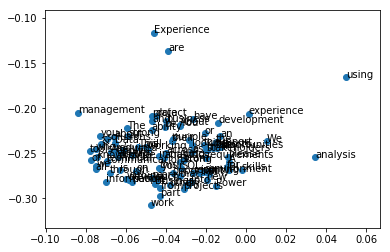

In [301]:
#observation from the tsne plot is the separation of analyst away from scientist, mining. 
#far left and top have gravitational pull of words around scientist and scientists like mining insights.. 
#analyst is close to intelligence and support reporting  

plt.scatter(Y[:, 0], Y[:, 1])

# Get current size
 
#plt.figsize(8,8)
for label, x, y in zip(word_list , Y[:, 0], Y[:, 1]):
        plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points')
#plt.xlim([-20.0,50.0]) 
#plt.ylim([-0.05,0.10])

plt.show() 

In [302]:
#check eyeball words in word2vec index 

import pandas as pd
points = pd.DataFrame(
    [
        (word, coords[0], coords[1]) 
        for word, coords in [
            (word, word_vectors_matrix[word_list.index(word)])
            for word in word_list
        ]
    ],
    columns=["word", "x", "y"]
)
#print("Points DataFrame built") 

points

,word,x,y
0,and,0.128142,0.232228
1,to,-0.093072,0.025361
2,the,-0.014672,0.173637
3,of,0.078166,0.241436
4,a,-0.263313,-0.010299
5,in,-0.147407,-0.134555
6,data,-0.381702,0.234336
7,with,-0.137964,0.096107
8,for,0.095358,0.015938
9,will,-0.395848,-0.253562


E:\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).


word_vectors_matrix shape is  (100, 400)


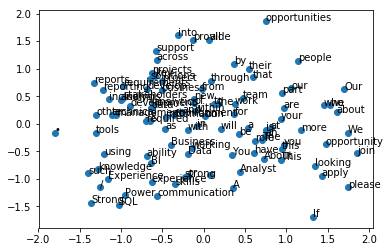

In [304]:
#PCA 
#Select 100 words from model vocabulary.. dimesions reduced from 300 to 2 via pca
from __future__ import absolute_import, division, print_function
import numpy as np
from sklearn.decomposition import IncrementalPCA
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import math
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA 
from sklearn import metrics


count = 100
word_vectors_matrix = np.ndarray(shape=(count, 400), dtype='float64')
word_list = []
i = 0
for word in model.wv.index2word:
    word_vectors_matrix[i] = model[word]
    word_list.append(word)
    i = i+1
    if i == count:
        break
print("word_vectors_matrix shape is ", word_vectors_matrix.shape)
#word_list


pca = PCA(n_components=2,svd_solver='full')
result = pca.fit_transform(word_vectors_matrix)

plt.scatter(result[:, 0], result[:, 1])
for label, x, y in zip(word_list , result[:, 0], result[:, 1]):
        plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points')
plt.show()

In [307]:
import pandas as pd
import numpy as np
import scipy as sp
from wordcloud import WordCloud
from wordcloud import WordCloud, STOPWORDS
from os import path
from PIL import Image
from textblob import TextBlob, Word
%matplotlib inline
import string
import nltk 
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
import re

In [313]:
corpus_raw = jobs[jobs['Category']=='Data Scientist']

In [324]:
corpus_raw = ["".join(i) for i in jobs[jobs['Category']=='Data Scientist']['Job Description']]

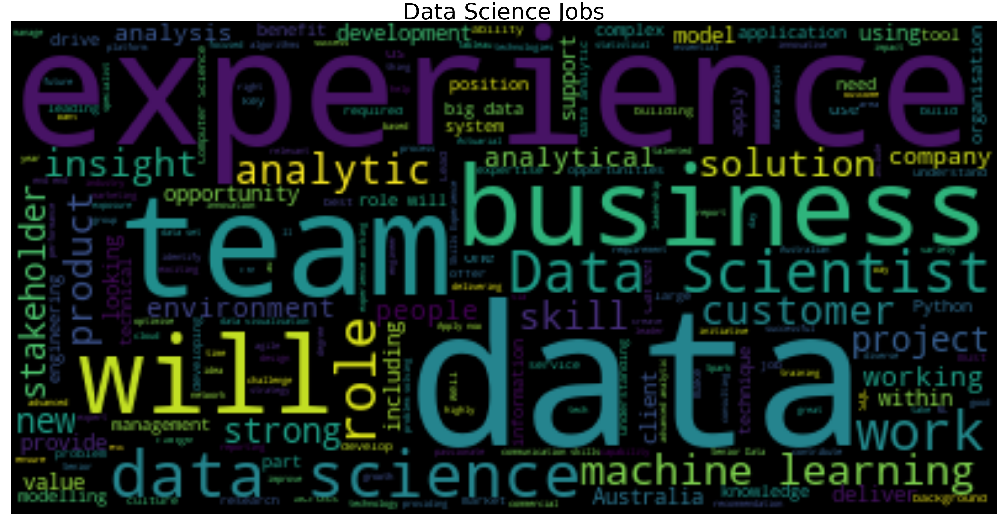

In [327]:
#Tag cloud of the subset of the dataframe for Data science jobs.  

from wordcloud import WordCloud
from wordcloud import WordCloud, STOPWORDS

corpus_raw

corpus_raw = ["".join(i) for i in jobs[jobs['Category']=='Data Scientist']['Job Description']]

corpus_raw = ' '.join(corpus_raw)
corpus

# Generate a word cloud image
wordcloud = WordCloud(background_color="black",stopwords=stopwords).generate(corpus_raw)
 
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (55.0, 80.0)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off") 
 
plt.title("Data Science Jobs", fontsize = 70)

plt.show()

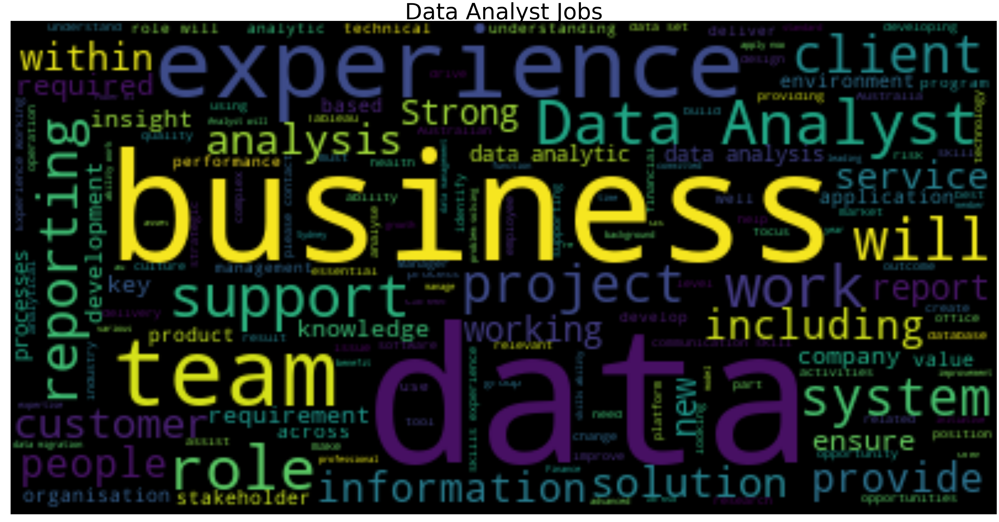

In [328]:
#Tag cloud of the subset of the dataframe for Data science jobs.  

from wordcloud import WordCloud
from wordcloud import WordCloud, STOPWORDS

corpus_raw

corpus_raw = ["".join(i) for i in jobs[jobs['Category']=='Data Analyst']['Job Description']]

corpus_raw = ' '.join(corpus_raw)
corpus

# Generate a word cloud image
wordcloud = WordCloud(background_color="black",stopwords=stopwords).generate(corpus_raw)
 
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (55.0, 80.0)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off") 
 
plt.title("Data Analyst Jobs", fontsize = 70)

plt.show()

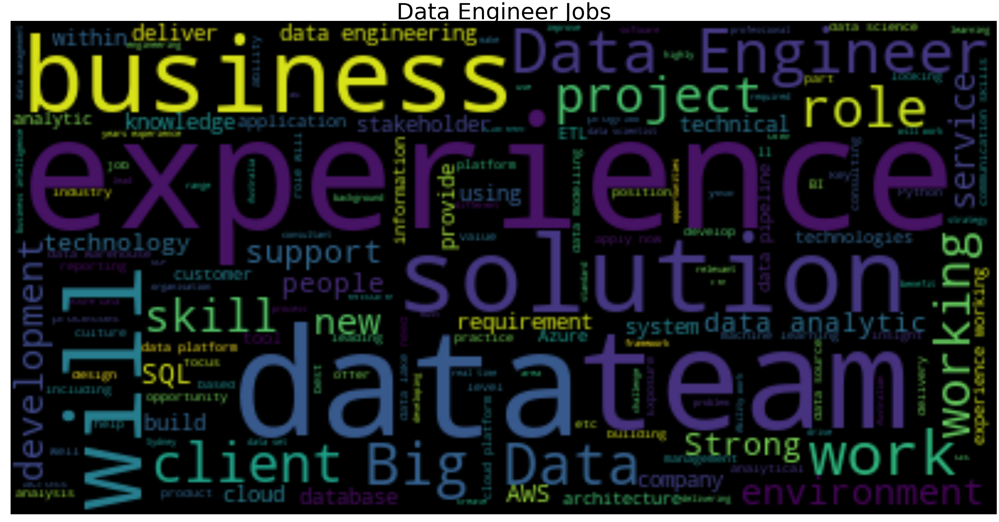

In [329]:
#Tag cloud of the subset of the dataframe for Data science jobs.  

from wordcloud import WordCloud
from wordcloud import WordCloud, STOPWORDS

corpus_raw

corpus_raw = ["".join(i) for i in jobs[jobs['Category']=='Data Engineer']['Job Description']]

corpus_raw = ' '.join(corpus_raw)
corpus

# Generate a word cloud image
wordcloud = WordCloud(background_color="black",stopwords=stopwords).generate(corpus_raw)
 
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (55.0, 80.0)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off") 
 
plt.title("Data Engineer Jobs", fontsize = 70)

plt.show()

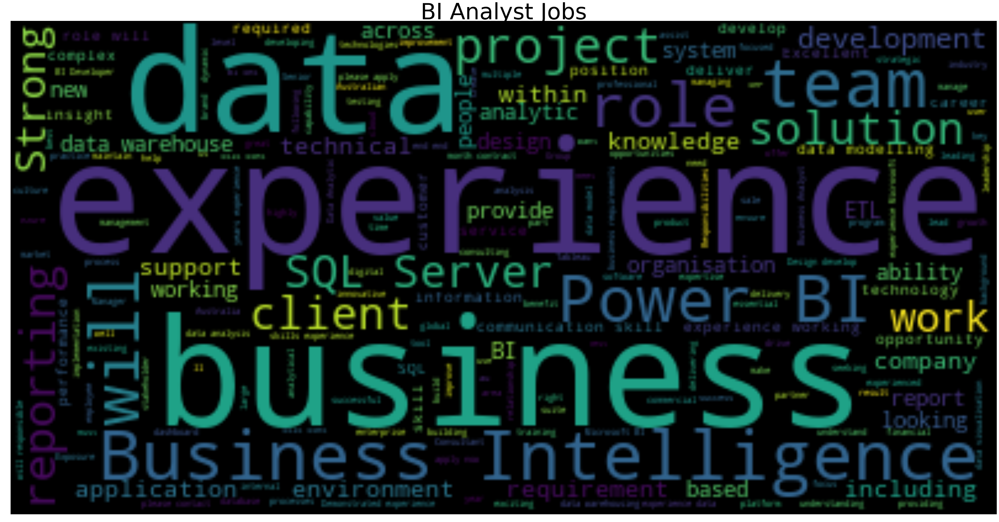

In [330]:
#Tag cloud of the subset of the dataframe for Data science jobs.  

from wordcloud import WordCloud
from wordcloud import WordCloud, STOPWORDS

corpus_raw

corpus_raw = ["".join(i) for i in jobs[jobs['Category']=='BI Analyst']['Job Description']]

corpus_raw = ' '.join(corpus_raw)
corpus

# Generate a word cloud image
wordcloud = WordCloud(background_color="black",stopwords=stopwords).generate(corpus_raw)
 
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (55.0, 80.0)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off") 
 
plt.title("BI Analyst Jobs", fontsize = 70)

plt.show()